### Klasy bazowe

In [1]:
import abc

import tensorflow as tf

class AbstractLayer(tf.keras.layers.Layer):
    """Abstract Layer."""
    
    def __init__(self):
        """Inits the class."""
        super(AbstractLayer, self).__init__()
    
    @abc.abstractmethod
    def call(self, inputs):
        """Makes forward pass of the layer."""
        pass


class AbstractModel(tf.keras.Model):
    """Abstract model."""

    def __init__(self):
        """Inits the class."""
        super(AbstractModel, self).__init__()

    @abc.abstractmethod
    def call(self, inputs, training=False):
        """Makes forward pass of the network."""
        pass

    @abc.abstractmethod
    def fit(self, **kwargs):
        """Fits the model.

        Replaces original fit method.
        
        More information can be found in documentation:
        https://www.tensorflow.org/guide/eager
        https://www.tensorflow.org/guide/autodiff
        """
        pass

    @abc.abstractmethod
    def predict(self, x):
        """Predicts x"""
        pass

### Instrukcje pomoniczne do wykonania przetwarzania wstępnego


In [2]:
import pickle

# Wczytanie zbioru danych
dataset_path = 'dataset.pkl'

with open(dataset_path, 'rb') as f:
    dataset = pickle.load(f)  
images_raw_train = dataset['train']['X']
images_raw_test = dataset['test']['X']
images_raw_valid = dataset['validation']['X']

labels = dataset['train']['y']
labels_test = dataset['test']['y']
lebels_valid = dataset['validation']['y']

# Ustawienie ziarna
tf.random.set_seed(1234)

# Zmiana rozmiaru obrazu z 224x224 do 64x64
images = tf.image.resize(
    images_raw_train, [64, 64], 
    method=tf.image.ResizeMethod.NEAREST_NEIGHBOR, 
    preserve_aspect_ratio=False,
    name=None
)

images_test = tf.image.resize(
    images_raw_test, [64, 64], 
    method=tf.image.ResizeMethod.NEAREST_NEIGHBOR, 
    preserve_aspect_ratio=False,
    name=None
)

images_valid = tf.image.resize(
    images_raw_valid, [64, 64], 
    method=tf.image.ResizeMethod.NEAREST_NEIGHBOR, 
    preserve_aspect_ratio=False,
    name=None
)

# Zmiana typu obrazów z int na float i normalizacja wartości pikseli z przedziału 0-255 do przedziału 0-1
images = tf.cast(images, tf.float32) / 255.0
images_test = tf.cast(images_test, tf.float32) / 255.0
images_valid = tf.cast(images_valid, tf.float32) / 255.0
    
# Zmiana wymiarowości z [8870] na [8870, 1] w celu zastosowania `SparseCategoricalCrossentropy`
labels = tf.reshape(labels, [-1, 1])
labels_test = tf.reshape(labels_test, [-1, 1])
labels_valid = tf.reshape(lebels_valid, [-1, 1])
# Do iterowania zbioru danych i podzielenia na paczki (ang. batch) można wykorzystać interfejs zdefiniowany w `tensorflow.data.Dataset`



Prezentacja danych:

<Figure size 432x288 with 0 Axes>

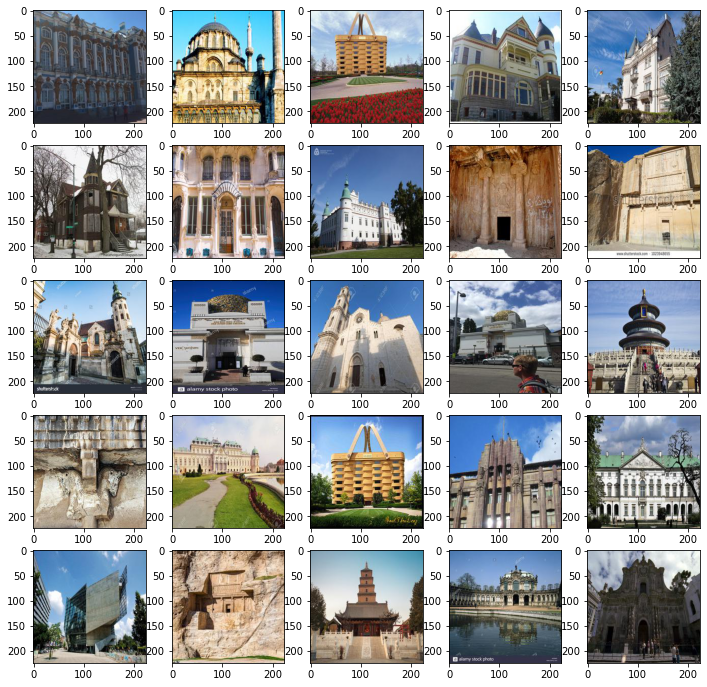

In [3]:
import matplotlib.pyplot as plt
plt.figure()
plt.figure(figsize=(12,12))
rows = 5
cols = 5
for img in range(rows*cols):
    plt.subplot(rows,cols,img+1)
    plt.imshow(dataset['train']['X'][img])
plt.show()

###  Implementacja modelu MLP

In [4]:
from tqdm import tqdm


In [5]:
import abc
import tensorflow as tf

class MLP_Layer(AbstractLayer):
    
    def __init__(self, units):
        """Inits the class."""
        self.units = units
        super(MLP_Layer, self).__init__()
    
    def build(self, input_shape):
        """Here we build our layer. Here will be create Weights and baiases"""
        self.w = self.add_weight(shape=(input_shape[-1], self.units),
                                      initializer=tf.random_uniform_initializer,
                                      trainable=True)
        
        self.b = self.add_weight(shape=(self.units,),initializer='random_normal',trainable=True)
        
    def call(self, inputs):
        """Makes forward pass of the layer."""
        #y = a*x +b  -> weights * input + bias
        ax = tf.matmul(inputs, self.w)
        y = ax + self.b
        return y    

In [6]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
import numpy as np
from sklearn.metrics import f1_score, accuracy_score
class MLP(AbstractModel):
    
    def __init__(self,from_logits=False):
        super(MLP, self).__init__()
        self.optim = tf.keras.optimizers.Adam(learning_rate=1e-3)
        self.loss_fn=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=from_logits) #from logits zamiast softmaxa można
        self.full_connected_1 = MLP_Layer(units=256)
        #full connected 14 units Softmax
        self.full_connected_2 = MLP_Layer(units=14)

    def call(self, inputs, training=False):
        """Makes forward pass of the network."""
        x = tf.reshape(inputs,[inputs.shape[0],64*64*3])
        x = self.full_connected_1(x)
        x = tf.nn.relu(x) #Activation 1 layer
        x = self.full_connected_2(x)
        x = tf.nn.softmax(x) #Activation 2 layer
        return x

    def fit(self, **kwargs):
        history = {'Loss':[],
                   'Accuracy':[],
                   'Fscore':[]}
        history_test = {'Loss':[],
                   'Accuracy':[],
                   'Fscore':[]}
        history_valid = {'Loss':[],
                    'Accuracy':[],
                   'Fscore':[]}
        
        batch_size = 100
        #print(type(history['loss']))
        train_dataset= kwargs['dataset']
        train_labels = kwargs['labels_train']
        test_dataset= kwargs['dataset_test']
        valid_dataset= kwargs['dataset_valid']
        labels_valid= kwargs['labels_valid']
        labels_test=kwargs['labels_test']
        
        num_epochs = kwargs['epochs']
        NUMBER_OF_CLASSES = 14
        train_ds = tf.data.Dataset.from_tensor_slices((images, labels)) 
        size=len(train_dataset)
        train_ds = train_ds.shuffle(buffer_size=size).batch(batch_size=batch_size)
        size = size/batch_size
        if(train_dataset!=None):
            for epoch in tqdm(range(num_epochs)):
                loss_sum = 0
                fscore = 0
                prec = 0
                recall = 0
                acc = 0
                iterator=0
                for x, y in train_ds:
                    iterator+=1
                    with tf.GradientTape() as tape:
                        y_prediction = self.call(x,training=True)
                        loss = self.loss_fn(y_true=y,y_pred=y_prediction)
                        loss_sum+=tf.keras.backend.sum(loss)
                    grads = tape.gradient(loss, self.trainable_variables)
                    self.optim.apply_gradients(zip(grads,self.trainable_variables))     
                history['Loss'].append((loss_sum/iterator).numpy())
                pred = self.predict(train_dataset)
                acc, F = self.validate(y_pred=pred,y_true=train_labels)
                history['Accuracy'].append(acc)
                history['Fscore'].append(F)
                   
            
                y_prediction = self.predict(test_dataset)
                y_loss = self.call(test_dataset).numpy()
                acc, F = self.validate(y_pred=y_prediction,y_true=labels_test)
                loss = self.loss_fn(y_true=labels_test,y_pred=y_loss)
                history_test['Loss'].append(loss.numpy())
                history_test['Accuracy'].append(acc)
                history_test['Fscore'].append(F)
                
                y_prediction = self.predict(valid_dataset)
                y_loss = self.call(valid_dataset).numpy()
                acc = self.validate(y_pred=y_prediction,y_true=labels_valid)
                loss = self.loss_fn(y_true=labels_valid,y_pred=y_loss)
                history_valid['Loss'].append(loss.numpy())
                history_valid['Accuracy'].append(acc)
                history_valid['Fscore'].append(F)
              
                
        else:
            print('provide dataset')
              
        return history, history_test, history_valid
        pass
    def validate(self,y_true,y_pred):
        re = tf.reshape(y_pred,[-1,1]).numpy()
        true = y_true.numpy()
       
       
        acc = accuracy_score(y_true=true,y_pred=re).sum()
        acc = np.mean(acc)
        F1 = f1_score(y_true=true,y_pred=re,average="macro")
        return acc, F1
    def predict(self, x):
        """Predicts x"""
        pred = self.call(x,training=False)
        return tf.argmax(input=pred, axis=1)
        
        

In [15]:
model=MLP()
history, history_test, history_valid = model.fit(dataset=images,labels_train=labels,epochs=25,dataset_test=images_test, dataset_valid=images_valid, labels_test=labels_test, labels_valid=labels_valid)


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [00:40<00:00,  1.60s/it]


In [ ]:
model2=MLP(from_logits=True)
history_logits, history_logits_test, history_logits_valid = model2.fit(dataset=images,labels_train=labels,epochs=25,dataset_test=images_test, dataset_valid=images_valid, labels_test=labels_test, labels_valid=labels_valid)


In [16]:
import pandas as pd
pd.DataFrame(history_test)

,Loss,Accuracy,Fscore
0,2.457460,0.194875,0.090695
1,2.405513,0.209036,0.111562
2,2.382124,0.217127,0.140800
3,2.353241,0.226905,0.137623
4,2.393511,0.207013,0.161753
5,2.324169,0.241403,0.178698
6,2.335298,0.234659,0.178597
7,2.296329,0.250843,0.174958
8,2.308323,0.242414,0.186866
9,2.336130,0.234659,0.187079


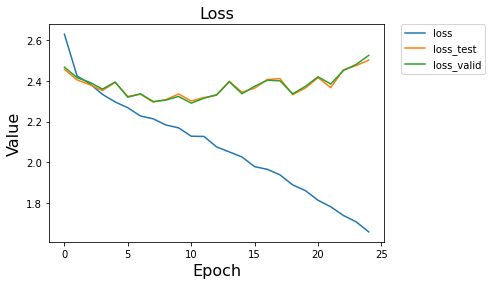

In [17]:
plt.plot(history['Loss'], label="loss")
plt.plot(history_test['Loss'], label="loss_test")
plt.plot(history_valid['Loss'], label="loss_valid")
plt.title('Loss', fontsize=16)
plt.xlabel('Epoch', fontsize=16)
plt.ylabel('Value', fontsize=16)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

[]

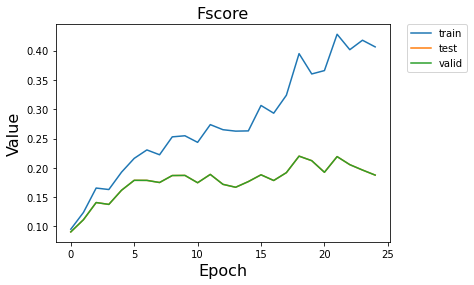

In [18]:
fig1, ax1 = plt.subplots()
ax1.plot(history['Fscore'], label="train")
ax1.plot(history_test['Fscore'],label="test")
ax1.plot(history_valid['Fscore'],label="valid")
plt.title('Fscore', fontsize=16)
plt.xlabel('Epoch', fontsize=16)
plt.ylabel('Value', fontsize=16)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
ax1.plot()

[]

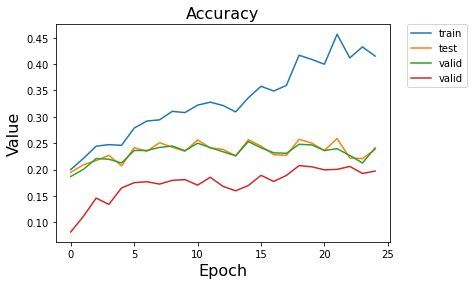

In [19]:

fig1, ax1 = plt.subplots()
ax1.plot(history['Accuracy'], label="train")
ax1.plot(history_test['Accuracy'],label="test")
ax1.plot(history_valid['Accuracy'],label="valid")
plt.title('Accuracy', fontsize=16)
plt.xlabel('Epoch', fontsize=16)
plt.ylabel('Value', fontsize=16)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
ax1.plot()

#Tutorial from https://deeplizard.com/learn/video/km7pxKy4UHU

In [20]:
%matplotlib inline
from sklearn.metrics import confusion_matrix
import itertools
import matplotlib.pyplot as plt

In [21]:
def plot_confusion_matrix(cm, classes,
                        normalize=False,
                        title='Confusion matrix',
                        cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [22]:
cm_plot_labels = list(dataset['labels_mapping'].keys())
cm_plot_labels

['indo-islamic',
 'chinese',
 'art_deco',
 'secession',
 'romanesque',
 'byzantine',
 'russian_revival',
 'victorian_quenn_anne',
 'neoclassical',
 'postmodernism',
 'baroque',
 'achaemenid',
 'ancient',
 'renaissance']

In [23]:
X = model.predict(images)

In [24]:
cm = confusion_matrix(y_true=labels, y_pred=X)

In [25]:
cm

array([[ 173,   13,    3,    4,   11,    2,    4,    0,    7,    1,  216,
           2,   35,    9],
       [   8,  329,    1,    4,   12,    0,    1,    1,   15,    1,   91,
           0,    0,    5],
       [   6,    6,   93,   69,    3,    4,    2,    1,    3,    6,  287,
           7,    9,   26],
       [   3,    3,   15,  135,    5,    1,    0,    2,    8,    0,  300,
           9,    2,   36],
       [  15,   10,    0,   12,  217,    3,    9,    7,   25,    4,  398,
           4,   10,   27],
       [   9,    1,    3,    5,    9,   88,    4,    2,    8,    2,  195,
           3,   14,   49],
       [  12,    4,    1,    8,   68,    6,   69,    1,   11,    5,  282,
           2,    7,   19],
       [   5,   23,    6,   11,   52,    1,    3,  272,   55,    4,  472,
           3,    8,   59],
       [   6,   14,    2,    4,   21,    2,    2,    6,  168,    5,  434,
           3,    7,   25],
       [  10,   16,    8,    9,   14,    0,    5,    3,   24,   83,  260,
           3,    

Confusion matrix, without normalization


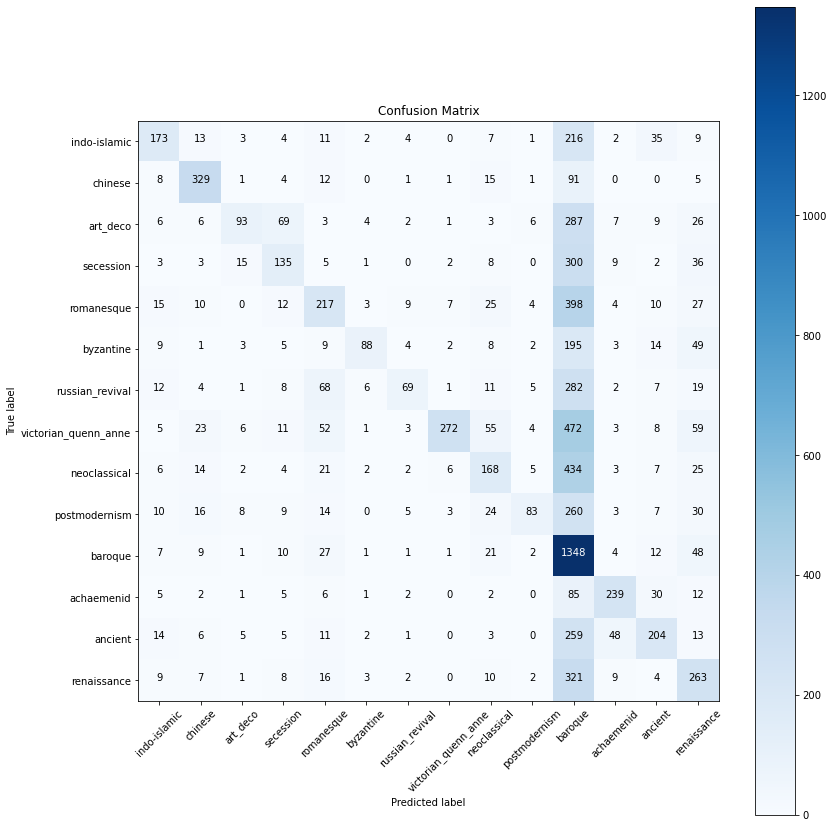

In [26]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 12
plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Confusion Matrix')

In [27]:
import matplotlib.pyplot as plt
cols = 2
rows = 5



In [28]:
good_img = []
bad_img = []
for i, prediction in enumerate(X):
    if labels[i] == prediction:
        good_img.append(i)
    else:
        bad_img.append(i)


In [29]:
rows = int(min(len(good_img),len(bad_img))*0.01)
rows

36

36


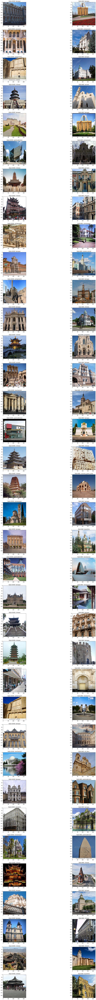

In [30]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 15
fig = plt.figure(figsize=(25,200))
columns = 2
print(rows)
ax = []
for i in range(rows*columns):
    style=""
    img_to_show = None
    ax.append( fig.add_subplot(rows, columns, i+1) )
    if i%2 == 0:
        img_to_show=dataset['train']['X'][good_img[i]]
        img_key = (labels[good_img[i]]).numpy()[0]
        style='GOOD: '+ cm_plot_labels[img_key]
        
    else:   
        img_to_show=dataset['train']['X'][bad_img[i-1]]
        img_key = (labels[good_img[i]]).numpy()[0]
        style='BAD: '+cm_plot_labels[img_key]
    ax[-1].set_title("Style:"+style)  # set title
    plt.imshow(img_to_show)

## WNIOSKI

1. Sieć MLP może być użytwa do zadania klasyfikacji i regresji
2. ustawienie flagi From_logits na True powoduje użycie jeszcze jednej funkcji aktywacji
3. Nie jestem wstanie jednoznacznie stwierdzić czemu jedne obrazy są łatwiejsze do rozpoznania i inne nie.
4. Model osiągnał: 

In [35]:
pd.DataFrame(history_test).tail(1)

,Loss,Accuracy,Fscore
24,2.503407,0.238368,0.187615


Co jest tragicznym wynikiem, czyli klasyfikator w zasadzie nie działa.